In [1]:
import torch

if torch.cuda.is_available():
    DEVICE = torch.device('cuda')
else:
    DEVICE = torch.device('cpu')

In [2]:
BATCH_SIZE = 64
INPUT_SIZE = 1000
HIDDEN_SIZE = 100
OUTPUT_SIZE = 10

In [3]:
x = torch.randn(BATCH_SIZE, INPUT_SIZE, device=DEVICE, dtype=torch.float, requires_grad=False)
y = torch.randn(BATCH_SIZE, OUTPUT_SIZE, device=DEVICE, dtype=torch.float, requires_grad=False)
w1 = torch.randn(INPUT_SIZE, HIDDEN_SIZE, device=DEVICE, dtype=torch.float, requires_grad=True)
w2 = torch.randn(HIDDEN_SIZE, OUTPUT_SIZE, device=DEVICE, dtype=torch.float, requires_grad=True)

In [4]:
learning_rate = 1e-6
for t in range(1, 501):
    y_pred = x.mm(w1).clamp(min=0).mm(w2)

    loss = (y_pred - y).pow(2).sum()
    if t % 100 == 0:
        print("Iteration: ", t, "\t", "Loss: ", loss.item())
    loss.backward()
    # print("before", w1[1])
    # print("before", w2[1])

    with torch.no_grad():
        w1 -= learning_rate * w1.grad
        w2 -= learning_rate * w2.grad

        # print("AFTER", w1[1])
        # print("after", w2[1])
        w1.grad.zero_()
        w2.grad.zero_()

Iteration:  100 	 Loss:  643.5104370117188
Iteration:  200 	 Loss:  6.679729461669922
Iteration:  300 	 Loss:  0.11807076632976532
Iteration:  400 	 Loss:  0.00264555960893631
Iteration:  500 	 Loss:  0.00020319690520409495


In [24]:
import os
import PIL
import glob
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms

PATH = '../image_check/'
image_files = glob.glob(PATH + '20230521T*.png')
images = np.zeros((len(image_files), 5041, 6975))
# len(image_files)
# img = imread(image_files[0])
# print(img.shape)
for image_file in image_files:
    img = PIL.Image.open(image_file).convert("L")
    images[image_file] = img



print(images.shape)

    # print(img)
# img = PIL.Image.open('../image_check/20230521T181642.749007.png')

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

(5041, 6975)
<PIL.Image.Image image mode=L size=6975x5041 at 0x201B17B21A0>


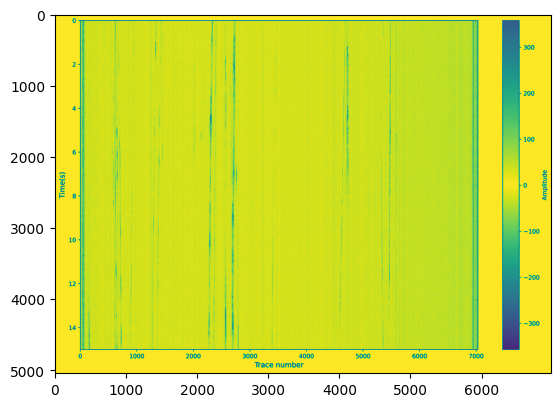

In [29]:
import os
import PIL
import glob
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms

PATH = '../image_check/'
image_files = glob.glob(PATH + '20230521T*.png')
# images = np.zeros((len(image_files), 5041, 6975))
# len(image_files)
# img = imread(image_files[0])
# print(img.shape)
img = PIL.Image.open(image_file).convert("L")
print(np.shape(img))
plt.imshow(img)

print(img)

    # print(img)
# img = PIL.Image.open('../image_check/20230521T181642.749007.png')

In [1]:
import obspy
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

def segy_to_numpy(segy_file):
    stream = obspy.read(segy_file, format='SEGY')
    data = np.array([trace.data for trace in stream])

    return data

def perc_clip_val(data,perc=100):
	# return clipping value by percent clip, does not apply clipping
	# data: array to clip
	# perc: percent value
	# output: min/max clip values
	mperc=(100.-perc)*0.01*0.5
	tmp=np.sort(data.flatten())
	minloc=int(len(tmp)*mperc)
	maxloc=len(tmp)-minloc-1
	clipmin=tmp[minloc]
	clipmax=tmp[maxloc]
	return clipmin,clipmax

def perc_clip(data,perc=100):
	# clip data
	# data: array to clip
	# perc=100: percent value, clip min/max (100-perc)/2 percent
	# output: clipped array
	if perc == 100:
		return data
	clipmin,clipmax=perc_clip_val(data,perc)
	return data.clip(clipmin,clipmax)

def bandpass(data, low, high, dt, axis=-1, order=6):
  nyquist = 0.5 / dt
  low = low / nyquist
  high = high / nyquist
  sos = signal.butter(order, [low, high], btype='bandpass', output='sos')
  return np.float32(signal.sosfiltfilt(sos, data, axis=axis))

segy_file = "../GeoFiber/20230521T181642.749007.segy"
numpy_array = segy_to_numpy(segy_file)
numpy_array = bandpass(numpy_array, 10, 200, 0.0005)
numpy_array_t = np.transpose(numpy_array)
data = perc_clip(numpy_array_t, 90)


(30000, 7031)
804.6340942382812 MB


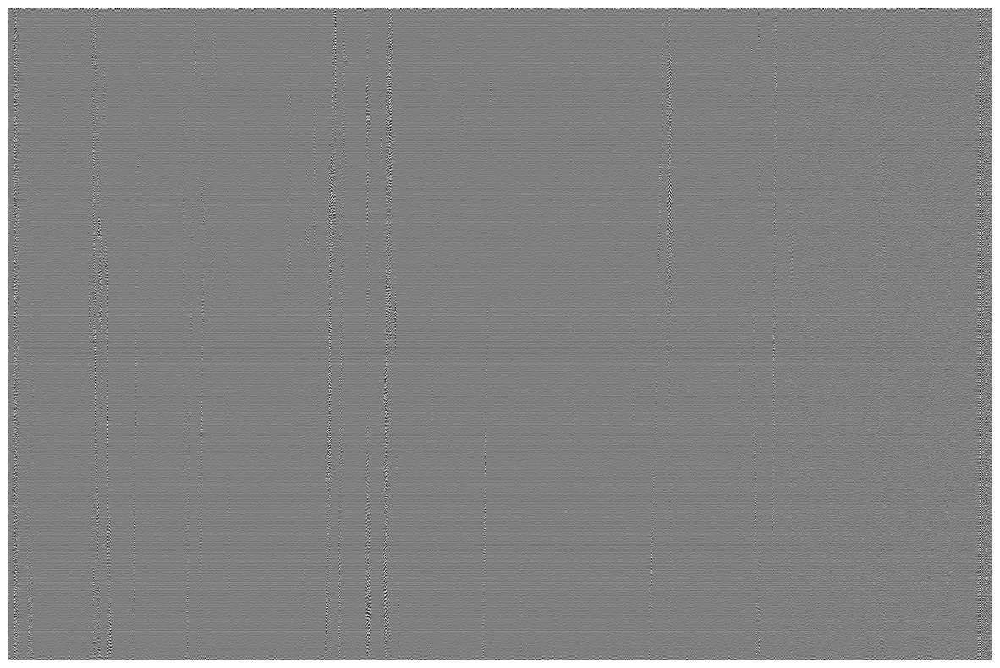

In [3]:
print(np.shape(data))
print(data.nbytes/1024**2, "MB")

plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data, aspect="auto", cmap='gray')
plt.axis('off')
plt.savefig('./test_image.png', dpi=600, bbox_inches='tight', pad_inches=0)
# plt.imshow(data, aspect="auto", extent=[0, 7131, 15, 0], cmap='gray')
# plt.imshow(data[:512, :2000], aspect="auto", extent=[1, 512, 1, 0], cmap='bwr')

# clb=plt.colorbar()
# clb.ax.set_ylabel("Amplitude", loc='center')

(4620, 6975)
(4620, 6900)
[ 68 147 124 ... 181 227 223]


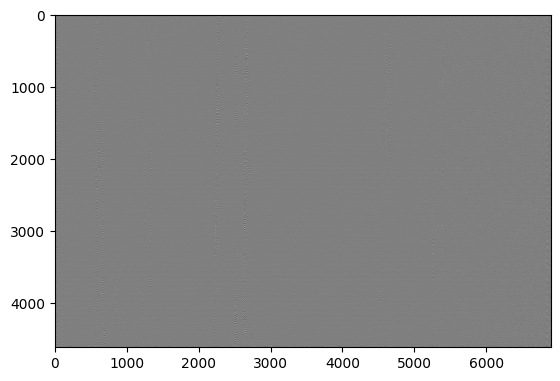

In [18]:
import os
import PIL
import glob
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms

# PATH = './'
# image_file = glob.glob(PATH + 'test_image.png')
# images = np.zeros((len(image_files), 5041, 6975))
# len(image_files)
# img = imread(image_files[0])
# print(img.shape)
# img = PIL.Image.open(image_file).convert("L")
img = PIL.Image.open('./test_image.png').convert("L")
img = np.array(img.getchannel(0))
print(np.shape(img))
img = img[:,37:-38]
print(np.shape(img))

plt.imshow(img, cmap="gray")

print(img[0,:])

    # print(img)
# img = PIL.Image.open('../image_check/20230521T181642.749007.png')

In [40]:
x_num, y_num = 300, 300
x_count, y_count = int(img.shape[0]/x_num), int(img.shape[1]/y_num)
print(x_count, y_count)

data = np.zeros((x_count, x_num, y_num, y_count))
for j in range(x_count):
    for i in range(y_count):
        data_temp = img[j*x_num:(j+1)*x_num, i*y_num:(i+1)*y_num]
        data[j,:,:,i] = data_temp
        # print(i*y_num, (i+1)*y_num)
print(np.shape(data_temp))
print(j*x_num,(j+1)*x_num)

15 23
(300, 300)
4200 4500


In [37]:
print(data[0,:])
print(np.shape(data[0,:]))

[[[ 68. 128.  36. ... 138.  14. 230.]
  [147. 127. 121. ... 103. 227. 232.]
  [124. 179.  68. ... 204. 241. 227.]
  ...
  [226.  16. 209. ...  27.  56. 181.]
  [130.  21. 221. ...  21.  22. 227.]
  [163.  58. 224. ...  16.  62. 223.]]

 [[  2.  81.  85. ... 153.   0. 255.]
  [ 10.  56.  58. ... 142. 248. 255.]
  [  7. 103.  51. ... 255. 255. 255.]
  ...
  [183.   1. 100. ...  18. 107. 101.]
  [109.  31. 108. ...   0.   0. 194.]
  [ 87.  58. 158. ...   0.  50. 121.]]

 [[ 29. 109.  81. ... 147.   0. 255.]
  [ 36.  89. 121. ... 137. 248. 255.]
  [ 15. 115.  88. ... 250. 255. 255.]
  ...
  [238.  29.   0. ...   0. 113. 147.]
  [154.  83.   1. ...   0.  30. 219.]
  [158. 108.  36. ...   0.  75. 189.]]

 ...

 [[251. 149. 155. ... 113.  75.  77.]
  [246.  83.  95. ...  60.  72.  42.]
  [243.  59.  89. ...  73.  69.  67.]
  ...
  [ 94. 118.  71. ... 119. 232. 173.]
  [150.  88.  89. ... 168. 220. 224.]
  [134. 105. 102. ...  54. 136. 233.]]

 [[255.  84.  94. ... 204. 195. 217.]
  [255. 109.

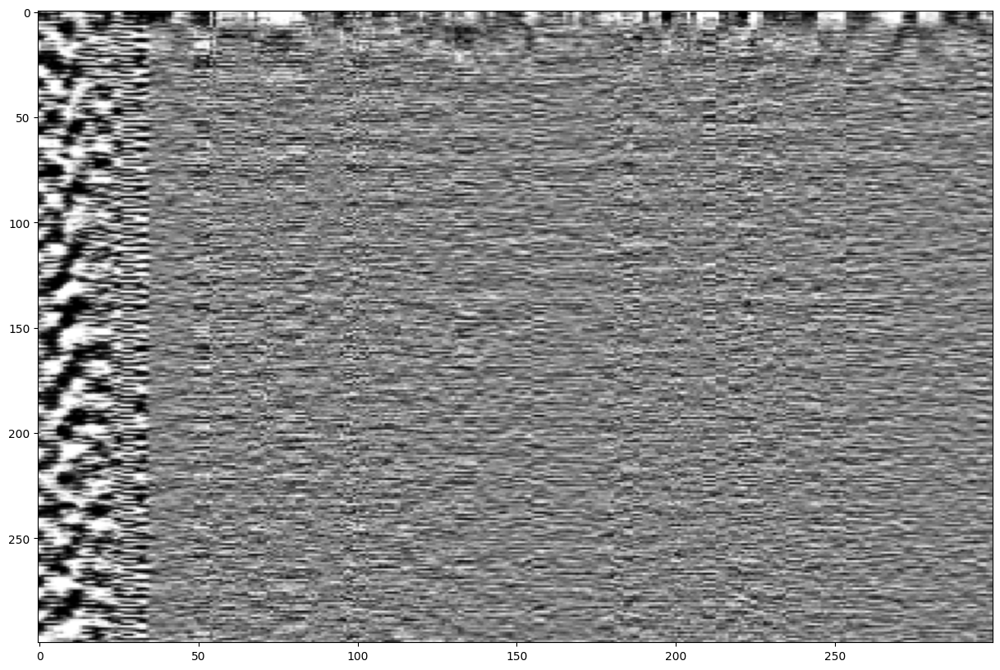

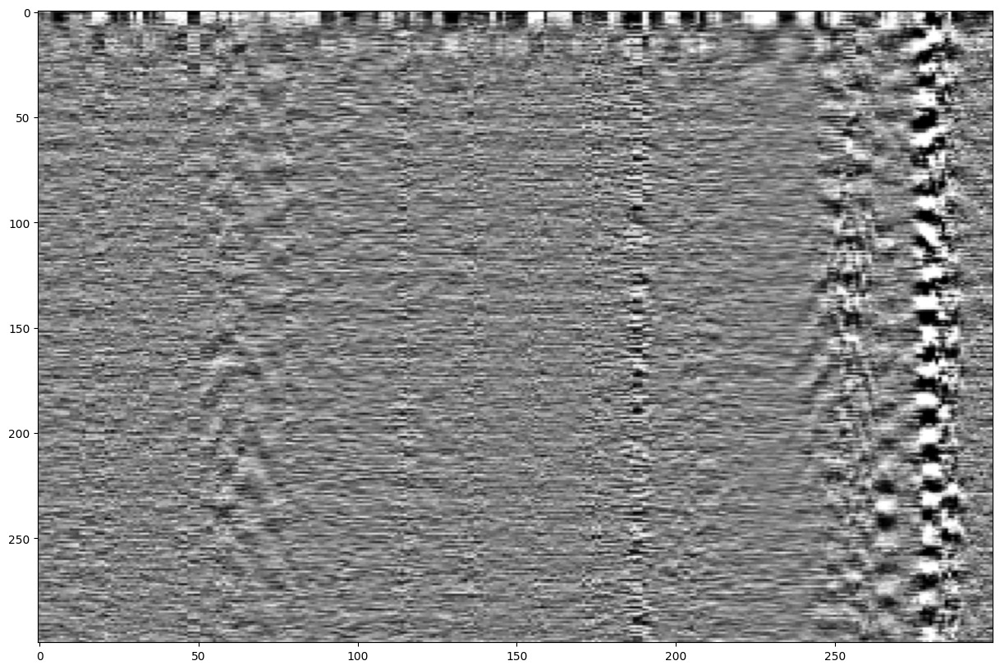

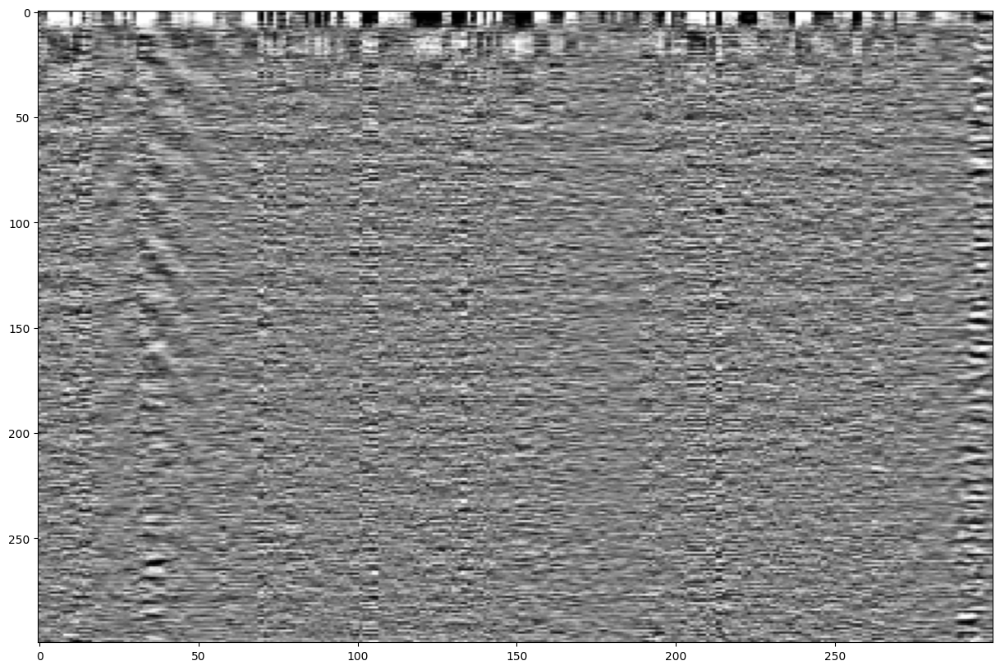

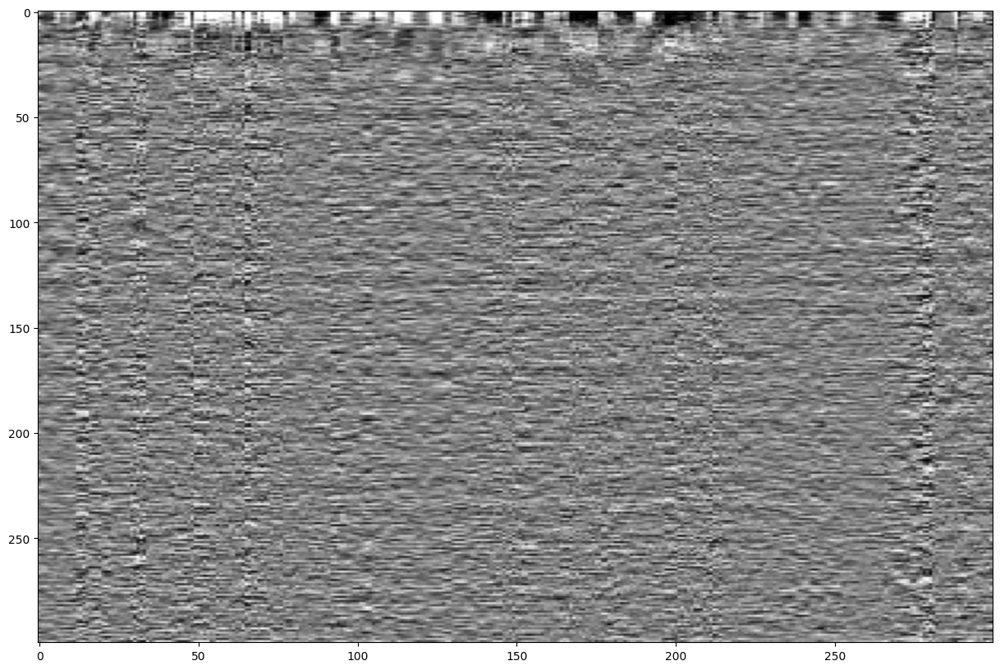

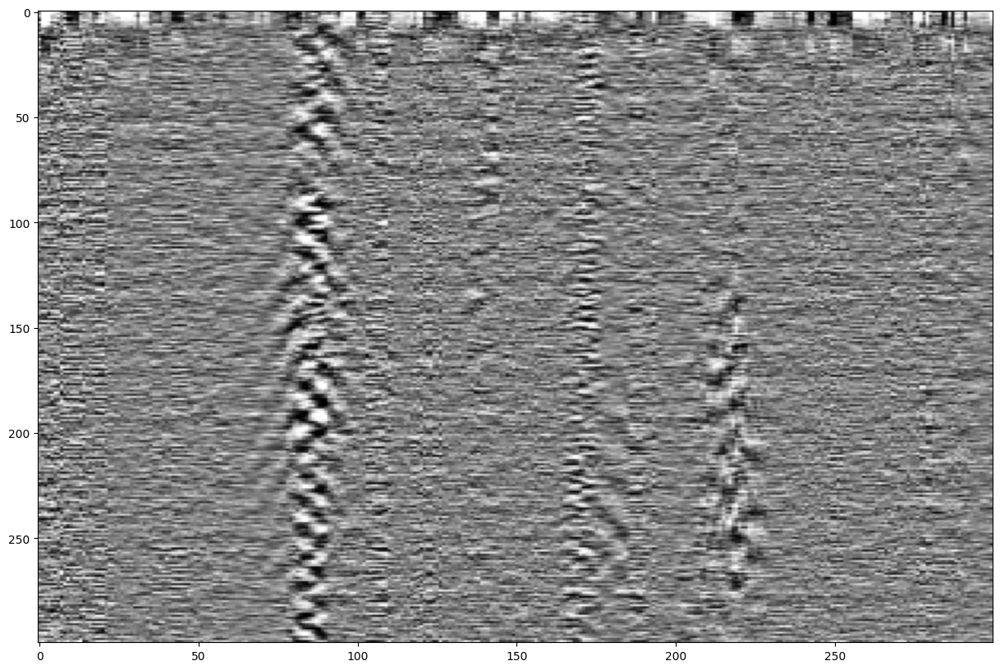

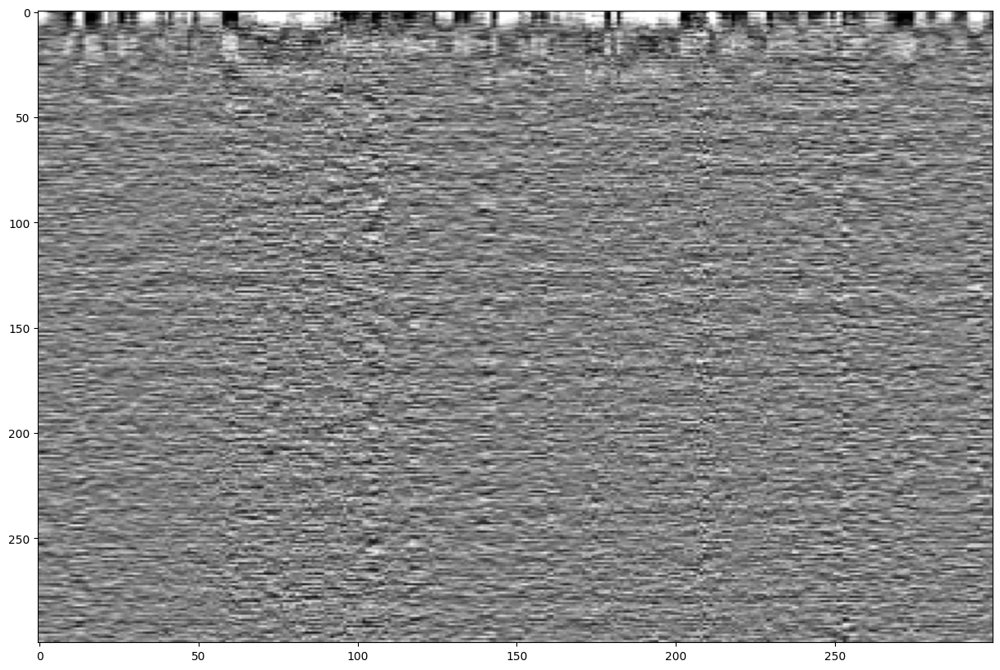

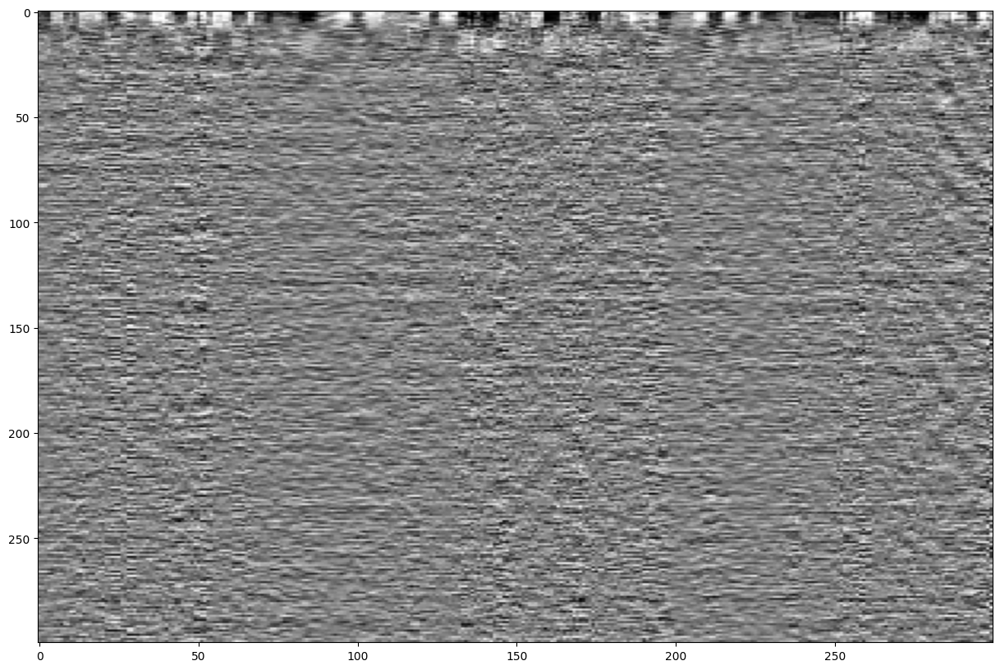

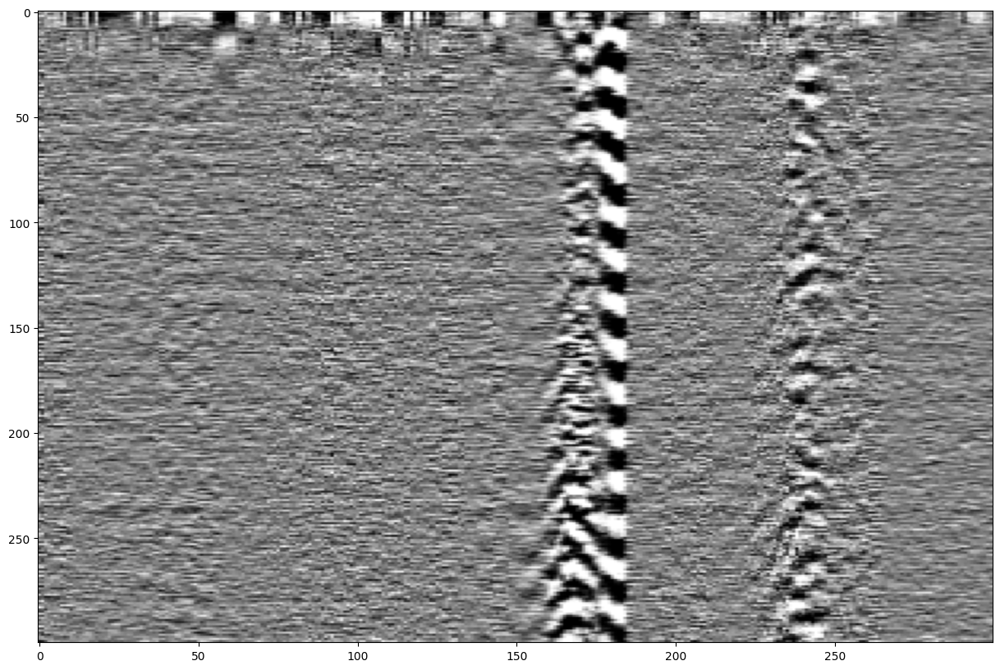

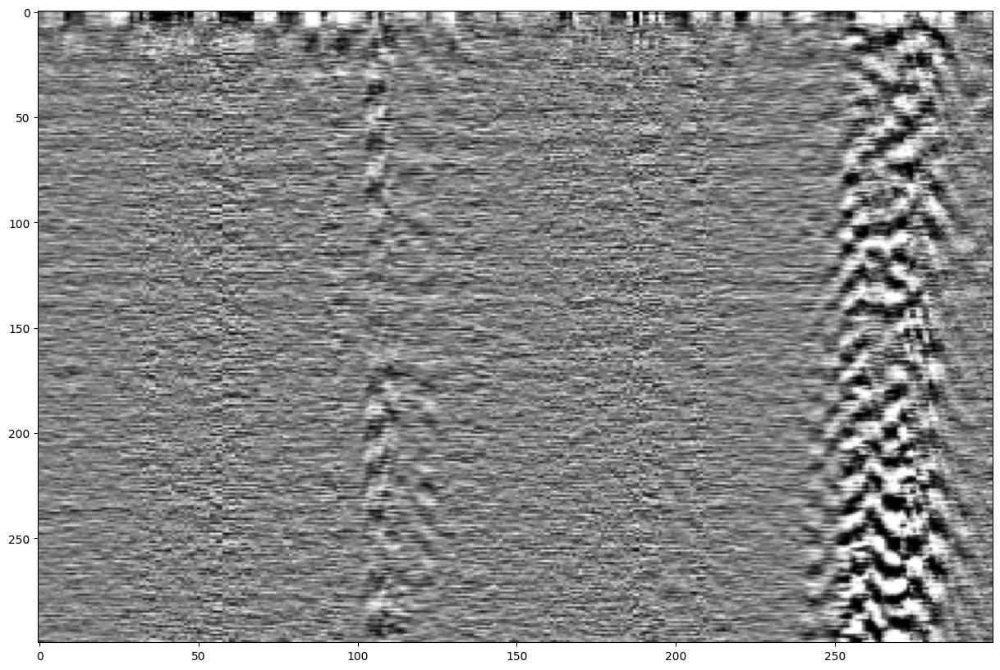

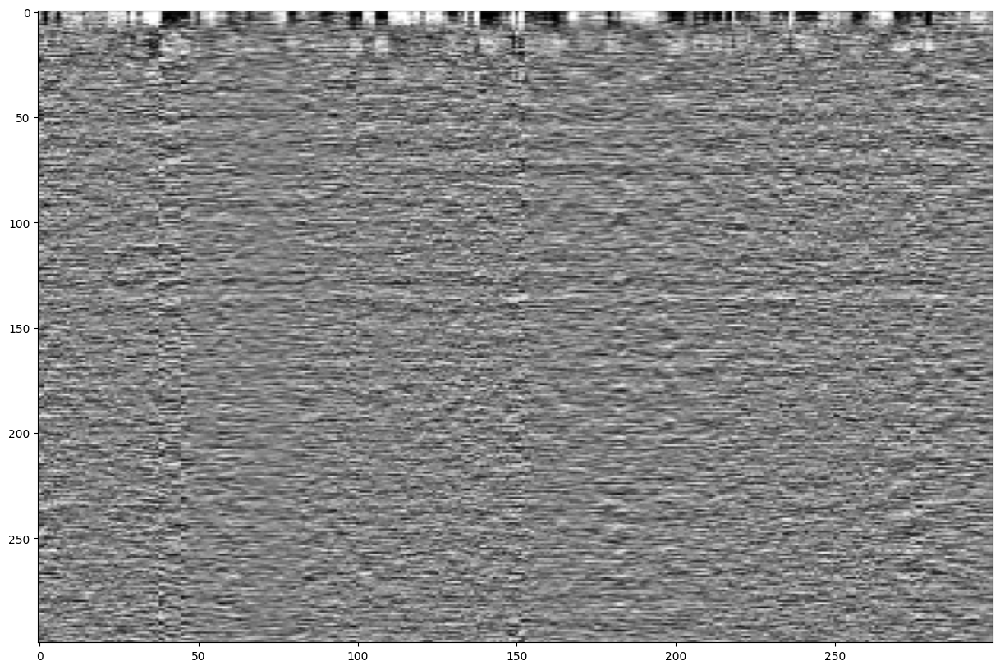

In [39]:
plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data[0,:,:,0], aspect="auto", cmap='gray')
plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data[0,:,:,1], aspect="auto", cmap='gray')
plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data[0,:,:,2], aspect="auto", cmap='gray')
plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data[0,:,:,3], aspect="auto", cmap='gray')
plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data[0,:,:,4], aspect="auto", cmap='gray')
plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data[0,:,:,5], aspect="auto", cmap='gray')
plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data[0,:,:,6], aspect="auto", cmap='gray')
plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data[0,:,:,7], aspect="auto", cmap='gray')
plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data[0,:,:,8], aspect="auto", cmap='gray')
plt.figure(figsize=[15,10], frameon=False)
plt.imshow(data[0,:,:,9], aspect="auto", cmap='gray')

In [54]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

# data = h5py.File('./0000653471_2023-02-06_10.14.57.46832.hdf5', "r")['DAS']
data = h5py.File('./0000653471_2023-02-06_10.14.57.46832.hdf5', "r")
print(data.keys())


# data_temp = data[:300, :]

<KeysViewHDF5 ['DAQ', 'DAS', 'Interrogator', 'Metadata', 'ProcessingServer']>


In [59]:
print(data['DAQ'].keys())
# print(data['DAS'].keys())
print(data['Interrogator'].keys())
print(data['Metadata'].keys())
print(data['ProcessingServer'].keys())


<KeysViewHDF5 ['ACCoupled', 'BandwidthLimiterEnabled', 'BaseCardVersion', 'ChannelCount', 'ClockFrequency', 'ClockOutputEnabled', 'Driver', 'DriverVersion', 'ExtendedModuleVersion', 'ExternalClockEnabled', 'FiftyOhmEnabled', 'InputPathEnabled', 'InstalledMemory', 'KernelVersion', 'ModuleVersion', 'MultipleTriggerEnabled', 'PositionEnd', 'PositionStart', 'ProductionDate', 'RepetitionFrequency', 'SampleEnd', 'SampleStart', 'SamplingInterval', 'SamplingRate', 'SerialNumber', 'SpatialPoints', 'TriggerACCoupleEnabled', 'TriggerAnalogModeEnabled', 'TriggerFiftyOhmEnabled', 'TriggerLevel', 'Type', 'VoltageRange']>
<KeysViewHDF5 ['ActiveOpticalChannelNumber', 'BaseBoardRevision', 'BaseClockPeriod', 'ClockDivider', 'Dac0Timing', 'Dac2Timing', 'DeviceName', 'EDFACurrent', 'FPGARevisionMajor', 'FPGARevisionMinor', 'FiberRefractiveIndex', 'LaserRevision', 'Model', 'PulserBoardRevision', 'PulserDac', 'PulserTecDac', 'ReferenceCoilEnabled', 'SOARevision', 'SerialNumber', 'TimingAomStartNs', 'TimingA

In [79]:
# print(data['DAQ']['PositionStart'][0]) # Unit: m
# print(data['DAQ']['PositionEnd'][0]) # Unit: m
# print(data['DAQ']['ChannelCount'])
# print(data['DAQ']['ChannelCount'][0])
# print(data['DAQ']['SamplingInterval']) # Unit: s
# print(data['DAQ']['SamplingInterval'][0]) # Unit: s
print(data['DAQ']['SpatialPoints'])
print(data['DAQ']['SpatialPoints'][0])

print(data['ProcessingServer']['SpatialSampling'])
print(data['ProcessingServer']['SpatialSampling'][0])
print(data['DAQ']['PositionEnd'][0] / data['ProcessingServer']['SpatialSampling'][0])

print(data['Metadata']['TraceCount'][0])
print(data['Metadata']['Location'])
print(data['Metadata']['Location'][0])
print(data['ProcessingServer']['GaugeLength'][0])
print(data['ProcessingServer']['GaugeLengthPoints'][0])


<HDF5 dataset "SpatialPoints": shape (1,), type "<i4">
7031
<HDF5 dataset "SpatialSampling": shape (1,), type "<f4">
5.104762
7033.3331156763015
600000
<HDF5 dataset "Location": shape (1,), type "|O">
b''
10.209524
24


[[-317 -317 -317 ...  -55  -55    0]
 [   0    0  232 ...  293    0    0]
 [   0    0  125 ... -996    0    0]
 ...
 [   0  236  236 ... -447 -447  -10]
 [   0 -268 -268 ... -200 -200    0]
 [-226 -263 -263 ...   88    0    0]]


 ...]

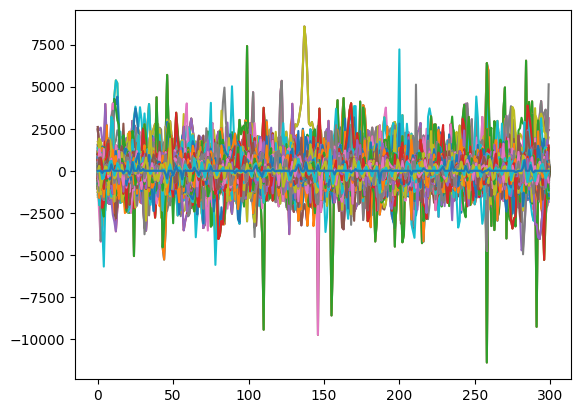

In [49]:
print(data_temp)

plt.plot(data_temp)

In [80]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Deep_SVDD(nn.Module):
    def __init__(self, z_dim=32):
        super(Deep_SVDD, self).__init__()
        self.pool = nn.MaxPool2d(2,2)

        self.conv1 = nn.Conv2d(1, 8, 5, bias=False, padding=2)
        self.bn1 = nn.BatchNorm2d(8, eps=1e-04, affine=False)
        self.conv2 = nn.Conv2d(8, 4, 5, bias=False, padding=2)
        self.bn2 = nn.BatchNorm2d(4, eps=1e-04, affine=False)
        self.fc1 = nn.Linear(4*7*7, z_dim, bias=False)

    def forward(self, x):
        x = self.conv1(x)
        x = self.pool(F.leaky_relu(self.bn1(x)))
        x = self.conv2(x)
        x = self.pool(F.leaky_relu(self.bn2(x)))
        x = x.view(x.size(0), -1)
        return self.fc1(x)
    
class pretrain_autoencoder(nn.Module):
    def __init__(self, z_dim=32):
        super(pretrain_autoencoder, self).__init__()
        self.z_dim = z_dim
        self.pool = nn.MaxPool2d(2,2)

        self.conv1 = nn.Conv2d(1, 8, 5, bias=False, padding=2)
        self.bn1 = nn.BatchNorm2d(8, eps=1e-04, affine=False)
        self.conv2 = nn.Conv2d(8, 4, 5, bias=False, padding=2)
        self.bn2 = nn.BatchNorm2d(4, eps=1e-04, affine=False)
        self.fc1 = nn.Linear(4*7*7, z_dim, bias=False)

        self.deconv1 = nn.ConvTranspose2d(2, 4, 5, bias=False, padding=2)
        self.bn3 = nn.BatchNorm2d(4, eps=1e-04, affine=False)
        self.deconv2 = nn.ConvTranspose2d(4, 8, 5, bias=False, padding=3)
        self.bn4 = nn.BatchNorm2d(8, eps=1e-04, affine=False)
        self.deconv3 = nn.ConvTranspose2d(8, 1, 5, bias=False, padding=2)

    def encoder(self, x):
        x = self.conv1(x)
        x = self.pool(F.leaky_relu(self.bn1(x)))
        x = self.conv2(x)
        x = self.pool(F.leaky_relu(self.bn2(x)))
        x = x.view(x.size(0), -1)
        return self.fc1(x)
    
    def decoder(self, x):
        x = x.view(x.size(0), int(self.z_dim / 16), 4, 4)
        x = F.interpolate(F.leaky_relu(x), scale_factor=2)
        x = self.deconv1(x)
        x = F.interpolate(F.leaky_relu(self.bn3(x)), scale_factor=2)
        x = self.deconv2(x)
        x = F.interpolate(F.leaky_relu(self.bn4(x)), scale_factor=2)
        x = self.deconv3(x)
        return torch.sigmoid(x)
    
    def forward(self, x):
        z = self.encoder(x)
        x_hat = self.decoder(z)
        return x_hat

In [123]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Deep_SVDD(nn.Module):
    def __init__(self, z_dim=32):
        super(Deep_SVDD, self).__init__()
        self.pool = nn.MaxPool2d(2,2)

        self.conv1 = nn.Conv2d(1, 8, 5, bias=False, padding=2)
        self.bn1 = nn.BatchNorm2d(8, eps=1e-04, affine=False)
        self.conv2 = nn.Conv2d(8, 4, 5, bias=False, padding=2)
        self.bn2 = nn.BatchNorm2d(4, eps=1e-04, affine=False)
        self.fc1 = nn.Linear(4*7*7, z_dim, bias=False)

    def forward(self, x):
        x = self.conv1(x)
        x = self.pool(F.leaky_relu(self.bn1(x)))
        x = self.conv2(x)
        x = self.pool(F.leaky_relu(self.bn2(x)))
        x = x.view(x.size(0), -1)
        return self.fc1(x)
    
class pretrain_autoencoder(nn.Module):
    def __init__(self, z_dim=128):
        super(pretrain_autoencoder, self).__init__()
        self.z_dim = z_dim
        self.pool = nn.MaxPool2d(2,2)

        self.conv1 = nn.Conv2d(1, 8, 5, bias=False, padding=2)
        self.bn1 = nn.BatchNorm2d(8, eps=1e-04, affine=False)
        self.conv2 = nn.Conv2d(8, 16, 5, bias=False, padding=2)
        self.bn2 = nn.BatchNorm2d(16, eps=1e-04, affine=False)
        self.conv3 = nn.Conv2d(16, 32, 5, bias=False, padding=2)
        self.bn3 = nn.BatchNorm2d(32, eps=1e-04, affine=False)
        self.conv4 = nn.Conv2d(32, 32, 5, bias=False, padding=2)
        self.bn4 = nn.BatchNorm2d(32, eps=1e-04, affine=False)
        self.fc1 = nn.Linear(8192, 2048, bias=False)
        self.fc2 = nn.Linear(2048, 512, bias=False)
        self.fc3 = nn.Linear(512, 128, bias=False)

        self.fc4 = nn.Linear(128, 512, bias=False)
        self.fc5 = nn.Linear(512, 2048, bias=False)
        self.fc6 = nn.Linear(2048, 8196, bias=False)
        self.deconv1 = nn.ConvTranspose2d(32, 32, 5, bias=False, padding=2)
        self.bn5 = nn.BatchNorm2d(32, eps=1e-04, affine=False)
        self.deconv2 = nn.ConvTranspose2d(32, 16, 5, bias=False, padding=2)
        self.bn6 = nn.BatchNorm2d(16, eps=1e-04, affine=False)
        self.deconv3 = nn.ConvTranspose2d(16, 8, 5, bias=False, padding=2)
        self.bn7 = nn.BatchNorm2d(8, eps=1e-04, affine=False)
        self.deconv4 = nn.ConvTranspose2d(8, 1, 5, bias=False, padding=2)

    def encoder(self, x):
        x = self.conv1(x)
        x = self.pool(F.elu(self.bn1(x)))
        x = self.conv2(x)
        x = self.pool(F.elu(self.bn2(x)))
        x = self.conv3(x)
        x = self.pool(F.elu(self.bn3(x)))
        x = self.conv4(x)
        x = self.pool(F.elu(self.bn4(x)))
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        output = x
        return output
    
    def decoder(self, x):
        x = self.fc4(x)
        x = self.fc5(x)
        x = self.fc6(x)
        x = x.view(x.size(0), 32, 16, 16)
        # x = x.view(1, 32, 16, 16)
        x = F.interpolate(F.elu(x), scale_factor=2)
        x = self.deconv1(x)
        x = F.interpolate(F.elu(self.bn5(x)), scale_factor=2)
        x = self.deconv2(x)
        x = F.interpolate(F.elu(self.bn6(x)), scale_factor=2)
        x = self.deconv3(x)
        x = F.interpolate(F.elu(self.bn7(x)), scale_factor=2)
        x = self.deconv4(x)
        output = x
        return output
    
    def forward(self, x):
        z = self.encoder(x)
        print(z.size())

        x_hat = self.decoder(z)
        print(x_hat.size())
        return x_hat

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Deep_SVDD(nn.Module):
    def __init__(self):
        super(Deep_SVDD, self).__init__()
        
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 8, 5, bias=False, padding=2),
            nn.BatchNorm2d(8, eps=1e-04, affine=False),
            nn.ELU(),
            nn.MaxPool2d(2,2),
            nn.Conv2d(8, 16, 5, bias=False, padding=2),
            nn.BatchNorm2d(16, eps=1e-04, affine=False),
            nn.ELU(),
            nn.MaxPool2d(2,2),
            nn.Conv2d(16, 32, 5, bias=False, padding=2),
            nn.BatchNorm2d(32, eps=1e-04, affine=False),
            nn.ELU(),
            nn.MaxPool2d(2,2),
            nn.Conv2d(32, 32, 5, bias=False, padding=2),
            nn.BatchNorm2d(32, eps=1e-04, affine=False),
            nn.ELU(),
            nn.Flatten(),
            nn.Linear(8192, 2048, bias=False),
            nn.Linear(2048, 512, bias=False),
            nn.Linear(512, 128, bias=False)
        )

    def forward(self, x):
        encoded = self.encoder(x)
        return encoded
    
class pretrain_autoencoder(nn.Module):
    def __init__(self):
        super(pretrain_autoencoder, self).__init__()
        
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 8, 5, bias=False, padding=2),
            nn.BatchNorm2d(8, eps=1e-04, affine=False),
            nn.ELU(),
            nn.MaxPool2d(2,2),
            nn.Conv2d(8, 16, 5, bias=False, padding=2),
            nn.BatchNorm2d(16, eps=1e-04, affine=False),
            nn.ELU(),
            nn.MaxPool2d(2,2),
            nn.Conv2d(16, 32, 5, bias=False, padding=2),
            nn.BatchNorm2d(32, eps=1e-04, affine=False),
            nn.ELU(),
            nn.MaxPool2d(2,2),
            nn.Conv2d(32, 32, 5, bias=False, padding=2),
            nn.BatchNorm2d(32, eps=1e-04, affine=False),
            nn.ELU(),
            nn.Flatten(),
            nn.Linear(8192, 2048, bias=False),
            nn.Linear(2048, 512, bias=False),
            nn.Linear(512, 128, bias=False)
        )

        self.decoder = nn.Sequential(
            nn.Linear(128, 512, bias=False),
            nn.Linear(512, 2048, bias=False),
            nn.Linear(2048, 8192, bias=False),
            nn.Unflatten(1, (32, 16, 16)),
            nn.ConvTranspose2d(32, 32, 5, bias=False, padding=2),
            nn.BatchNorm2d(32, eps=1e-04, affine=False),
            nn.ELU(),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose2d(32, 16, 5, bias=False, padding=2),
            nn.BatchNorm2d(16, eps=1e-04, affine=False),
            nn.ELU(),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose2d(16, 8, 5, bias=False, padding=2),
            nn.BatchNorm2d(8, eps=1e-04, affine=False),
            nn.ELU(),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose2d(8, 1, 5, bias=False, padding=2)
        )        
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded
    
input = torch.randn(1, 1, 128, 128)
model = pretrain_autoencoder()
encoded, decoded = model(input)

print(decoded.shape)

torch.Size([1, 1, 128, 128])


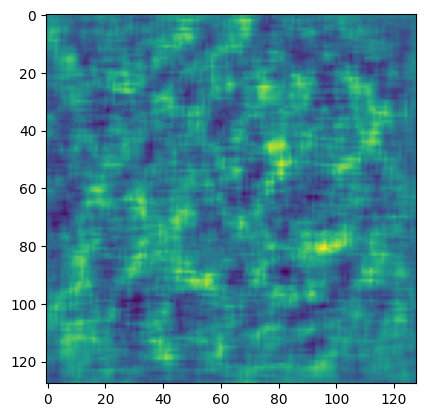

In [6]:
import matplotlib.pyplot as plt

plt.imshow(decoded[0,0,:,:].detach().numpy())

In [81]:
class TrainerDeepSVDD:
    def __init__(self, args, data_loader, device):
        self.args = args
        self.train_loader = data_loader
        self.device = device

    def pretrain(self):
        ae = pretrain_autoencoder(self.args.latent_dim).to(self.device)
        ae.apply(weights_init_normal)
        optimizer = torch.optim.Adam(ae.parameters(), lr=self.args.lr_ae, weight_decay=self.args.weight_decay_ae)
        scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=self.args.lr_milestones, gamma=0.1)
        ae.train()

        for epoch in range(self.args.num_epochs_ae):
            total_loss = 0
            for x, _ in self.train_loader:
                x = x.float().to(self.device)

                optimizer.zero_grad()
                x_hat = ae(x)
                reconst_loss = torch.mean(torch.sum((x_hat - x) ** 2, dim=tuple(range(1, x_hat.dim()))))
                reconst_loss.backward()
                optimizer.step()

                total_loss += reconst_loss.item()
            scheduler.step()
            print('Pretraining Autoencoder... Epoch: {}, Loss: {:.3f}'.format(epoch, total_loss/len(self.train_loader)))
        self.save_weights_for_DeepSVDD(ae, self.train_loader)

    def save_weights_for_DeepSVDD(self, model, dataloader):
        c = self.set_c(model, dataloader)
        net = DeepSVDD_network(self.args.latent_dim).to(self.device)
        state_dict = model.state_dict()
        net.load_state_dict(state_dict, strict=False)
        torch.save({'center': c.cpu().data.numpy().tolist(), 'net_dict': net.state_dict()}, 'path/to/parameter')

    def set_c(self, model, dataloader, eps=0.1):
        model.eval()
        z_ = []
        with torch.no_grad():
            for x, _ in dataloader:
                x = x.float().to(self.device)
                z = model.encoder(x)
                z_.append(z.detach())
        z_ = torch.cat(z_)
        c = torch.mean(z_, dim=0)
        c[(abs(c) < eps) & (c < 0)] = -eps
        c[(abs(c) < eps) & (c > 0)] = eps
        return c

    def train(self):
        net = DeepSVDD_network().to(self.device)

        if self.args.pretrain==True:
            state_dict = torch.load('path/to/parameter')
            net.load_state_dict(state_dict['net_dict'])
            c = torch.Tensor(state_dict['center']).to(self.device)
        else:
            net.apply(weights_init_normal)
            c = torch.randn(self.args.latent_dim).to(self.device)

        optimizer = torch.optim.Adam(net.parameters(), lr=self.args.lr, weight_decay=self.args.weight_decay)
        scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=self.args.lr_milestones, gamma=0.1)
        net.train()
        for epoch in range(self.args.num_epochs):
            total_loss = 0
            for x, _ in self.train_loader:
                x = x.float().to(self.device)

                optimizer.zero_grad()
                z = net(x)
                loss = torch.mean(torch.sum((z - c) ** 2, dim=1))
                loss.backward()
                optimizer.step()

                total_loss += loss.item()

            scheduler.step()
            print('Training Deep SVDD... Epoch: {}, Loss: {:.3f}'.format(epoch, total_loss/len(self.train_loader)))
        self.net = net
        self.c = c

        return self.net, self.c

def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1 and classname != 'Conv':
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("Linear") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)

In [84]:
import easydict

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
args = easydict.EasyDict({
        'num_epochs':50,
        'num_epochs_ae':50,
        'lr':1e-3,
        'lr_ae':1e-3,
        'weight_decay':5e-7,
        'weight_decay_ae':5e-3,
        'lr_milestones':[50],
        'batch_size':1024,
        'pretrain':True,
        'latent_dim':32,
        'normal_class':0
})

if __name__ == '__main__':
    dataloader_train, dataloader_test = get_mnist(args)
    deep_SVDD = TrainerDeepSVDD(args, dataloader_train, device)
    
    if args.pretrain:
        deep_SVDD.pretrain()
        
    net, c = deep_SVDD.train()

In [2]:
from nptdms import TdmsFile
import numpy as np

input_file = './1khz_50ns_20deci_2m_UTC_20190721_020429.783.tdms'
tdms_file=TdmsFile(input_file)
aa = tdms_file.read_metadata(input_file).properties['GPSTimeStamp']
print(aa)
metadata = tdms_file.read_metadata(input_file)
for item in metadata.properties:
    print(item, "=", metadata.properties[item])
# group = tdms_file.groups()
# print(np.shape(group))
# channel = tdms_file.groups().channel()[:,0]
# print(np.shape(channel))


[nptdms.tdms_segment WARNING] Data size 42240000 is not a multiple of the chunk size 1047552. Will attempt to read last chunk
[nptdms.tdms_segment WARNING] Data size 42240000 is not a multiple of the chunk size 1047552. Will attempt to read last chunk
[nptdms.tdms_segment WARNING] Data size 42240000 is not a multiple of the chunk size 1047552. Will attempt to read last chunk


2019-07-21T02:04:29.783232
name = 1khz_50ns_20deci_2m_UTC_20190721_020429.783
SamplingFrequency[Hz] = 1000.0
SpatialResolution[m] = 2.0
StartPosition[m] = 259.7947308002727
MeasureLength[m] = 1408
StreamTime[s] = inf
Continuous Mode = True
Source Mode = Normal
Power Decrement = 0.0
Start Distance (m) = -125.02095199999998
Stop Distance (m) = 1312.479464
Precise Sampling Frequency (Hz) = 20000.0
PeakVoltage[V] = 2.0
Pulse 2 Delay (ns) = 500.0
PulseWidth[ns] = 50.0
OffsetLength = 64.0
PreTrigSamples = 94
Reference length = 0
SavingBandwidth (MB/s) = 350.0
Reference Level 1 = 65535
Reference Level 2 = 56133
Reference Level 3 = 55585
FibreIndex = 1.4682
Fibre Length Multiplier = 1.020952
UserZeroRef = 0.0
Unit Calibration (nm) = 116.0
Diff Amplify Factor = 0
Attenuator 2 = 4.25
Fibre Length per Metre = 1.0
Zero Offset (m) = -125.02095199999998
Receiver Gain = 80.00	80.00	80.00

Pulse Width 2 (ns) = 50.0
Peak Voltage 2 (V) = 0.0
Tags = 
GaugeLength = 10.0
Attenuator 1 = 0.0
Time Decimation 

In [61]:
print(group[0].channels())
print(np.shape(group[0].channels()))
print(np.shape(group[0].channels()[0]))

[<TdmsChannel with path /'Measurement'/'0'>, <TdmsChannel with path /'Measurement'/'1'>, <TdmsChannel with path /'Measurement'/'2'>, <TdmsChannel with path /'Measurement'/'3'>, <TdmsChannel with path /'Measurement'/'4'>, <TdmsChannel with path /'Measurement'/'5'>, <TdmsChannel with path /'Measurement'/'6'>, <TdmsChannel with path /'Measurement'/'7'>, <TdmsChannel with path /'Measurement'/'8'>, <TdmsChannel with path /'Measurement'/'9'>, <TdmsChannel with path /'Measurement'/'10'>, <TdmsChannel with path /'Measurement'/'11'>, <TdmsChannel with path /'Measurement'/'12'>, <TdmsChannel with path /'Measurement'/'13'>, <TdmsChannel with path /'Measurement'/'14'>, <TdmsChannel with path /'Measurement'/'15'>, <TdmsChannel with path /'Measurement'/'16'>, <TdmsChannel with path /'Measurement'/'17'>, <TdmsChannel with path /'Measurement'/'18'>, <TdmsChannel with path /'Measurement'/'19'>, <TdmsChannel with path /'Measurement'/'20'>, <TdmsChannel with path /'Measurement'/'21'>, <TdmsChannel with p

In [62]:
trace = tdms_file.groups()[0].channels()

In [4]:
data=np.zeros(shape=(30000, 224))
for i in range(224):
    data[:,i] = group[0].channels()[300+i]


(30000, 224)
(3000, 224)


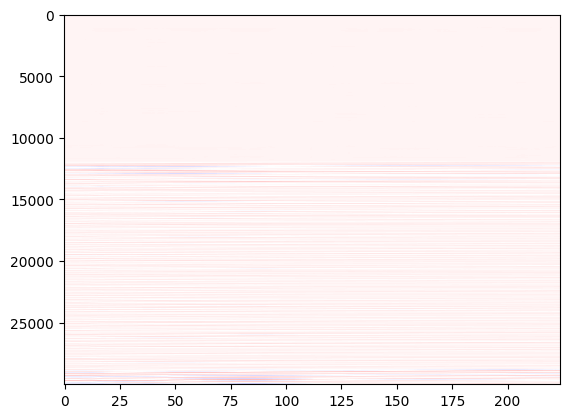

In [6]:
import matplotlib.pyplot as plt
print(np.shape(data))
plt.imshow(data[:,:], aspect="auto", cmap='bwr')

data=data[::10,:]
print(np.shape(data))


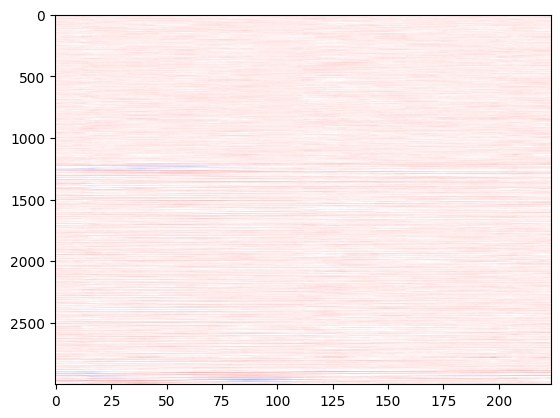

In [7]:
a=224
# plt.plot(range(30000), data[0,:])
plt.imshow(data[:,:], aspect="auto", cmap='bwr')

(224, 224)


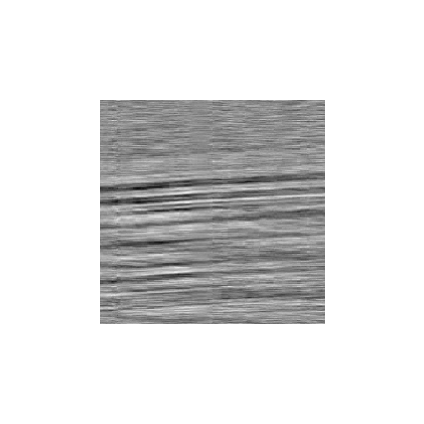

In [65]:
a=1150
b=224
# plt.imshow(data[b:b+a,:], aspect="auto", cmap='bwr')

desired_pixel = 291
dpi = 1000
plt.figure(figsize=(desired_pixel/dpi, desired_pixel/dpi), dpi=dpi)
plt.gray()
plt.imshow(data[a:a+b,:], aspect="1", cmap='gray')
print(data[a:a+b,:].shape)
plt.axis('off')
plt.savefig('image.png', bbox_inches='tight', pad_inches=0)



(224, 224)
239


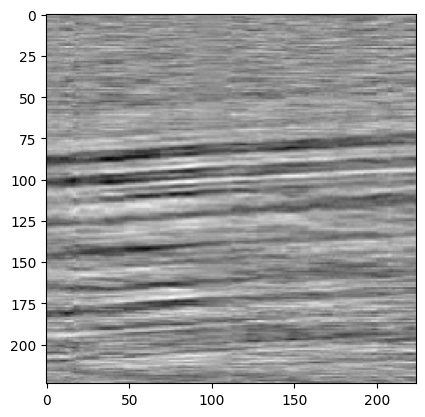

In [66]:
from PIL import Image

image = Image.open('image.png').convert('L')
print(np.shape(image))
print(np.max(image))
# plt.imshow(image, aspect="1", cmap='gray')
plt.imshow(image, aspect="1")


[nptdms.tdms_segment WARNING] Data size 42240000 is not a multiple of the chunk size 1047552. Will attempt to read last chunk


(704, 30000)
<class 'numpy.ndarray'>


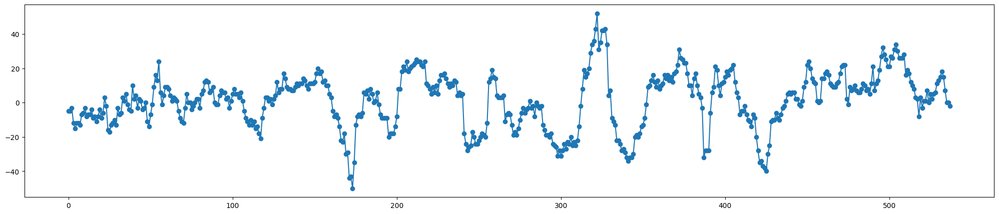

In [23]:
# for j in range(int(input_count / bundle)):
#             input_files_temp = input_files[j*bundle:(j+1)*bundle]
#             time = TdmsFile.read_metadata(input_files_temp[0]).properties['GPSTimeStamp']
#             a = 0
#             for input_file in input_files_temp:
#                 tdms_file=TdmsFile(input_file)
#                 trace = tdms_file.groups()[0].channels()
#                 for i in range(patch_size):
#                     data_temp[:,i] = trace[trace_start_num+i]
#                 data[a:a+sample_num_10deci,:]=data_temp[::10,:]
#                 a += sample_num_10deci
import matplotlib.pyplot as plt
import glob
from nptdms import TdmsFile


# input_file = sorted(glob.glob('))
tdms_file=TdmsFile('./1khz_50ns_20deci_2m_UTC_20190716_145929.894.tdms')
trace = tdms_file.groups()[0].channels()
trace = np.array(trace)
print(np.shape(trace))
print(type(trace))
plt.figure(figsize=(25,5))
plt.plot(trace[112:650,20000], 'o-')
# for i in trace[0,200]:
#     print(i)

In [24]:
with np.load('./npz/test_data.npz') as npz:
    data = npz['data']
    time = npz['time']

(840000, 100)


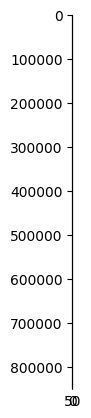

In [26]:
plt.imshow(data)
print(data.shape)